# 구글 드라이브 연동 & 이미지 데이터 셋 다운을 위한 환경설정

In [ ]:
import torch
import torchvision
from torchvision import transforms
from torchvision.transforms import ToTensor
from torchvision.io import read_image
from PIL import Image
import numpy as np
import cv2
import os
import csv
import matplotlib.pyplot as plt
import pandas as pd

In [ ]:
from google.colab import drive

# 구글 드라이브 연결
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
# 없는 폴더를 만드는 코드
def create_folder(directory):
    if not os.path.exists(directory):
      print('no')
      os.makedirs(directory)

In [ ]:
braille1 = './braillev5'
braille2 = './braillev8'
faster_rcnn = './brailleRcnn'
efficient = './brailleEffi'
create_folder(braille1)
create_folder(braille2)
create_folder(faster_rcnn)
create_folder(efficient)

# 이미지 데이터 셋 불러오기(roboflow)이용

In [ ]:
!pip install roboflow

Defaulting to user installation because normal site-packages is not writeable


## 1. Yolov5에 맞춘 데이터 셋

In [ ]:
%cd ./braillev5

from roboflow import Roboflow
rf = Roboflow(api_key="cl7UWczK6twHxJA5cpin")
project = rf.workspace("nicco-van-hamja-b1vxy").project("braillify")
version = project.version(1)
dataset = version.download("yolov5")


[Errno 2] No such file or directory: './braillev5'
/home/user/cv/braillev5


/usr/lib/python3/dist-packages/requests/__init__.py:87: RequestsDependencyWarning: urllib3 (2.2.1) or chardet (4.0.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "


loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to braillify-1 in yolov5pytorch:: 100%|██████████| 7650/7650 [00:00<00:00, 24852.76it/s]


## 2. Yolov8에 맞춘 데이터 셋

In [ ]:
%cd /home/user/cv/braillev8

from roboflow import Roboflow
rf = Roboflow(api_key="cl7UWczK6twHxJA5cpin")
project = rf.workspace("nicco-van-hamja-b1vxy").project("braillify")
version = project.version(1)
dataset = version.download("yolov8")

/home/user/cv/braillev8
loading Roboflow workspace...
loading Roboflow project...
[WARNING] we noticed you are downloading a `yolov8` datasets but you don't have `ultralytics` installed. Roboflow `.deploy` supports only models trained with `ultralytics==8.0.196`, to intall it `pip install ultralytics==8.0.196`.



Extracting Dataset Version Zip to braillify-1 in yolov8:: 100%|██████████| 7650/7650 [00:00<00:00, 23740.39it/s]


## 3. Faster-RCNN에 맞춘 데이터 셋(tensor)

In [ ]:
%cd /home/user/cv/brailleRcnn/

from roboflow import Roboflow
rf = Roboflow(api_key="cl7UWczK6twHxJA5cpin")
project = rf.workspace("nicco-van-hamja-b1vxy").project("braillify")
version = project.version(1)
dataset = version.download("coco")



/home/user/cv/brailleRcnn
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to braillify-1 in tfrecord:: 100%|██████████| 11/11 [00:00<00:00, 72.37it/s]


## 4.EfficientDet에 맞춘 데이터 셋

In [ ]:
%cd /home/user/cv/brailleEffi/

from roboflow import Roboflow
rf = Roboflow(api_key="cl7UWczK6twHxJA5cpin")
project = rf.workspace("nicco-van-hamja-b1vxy").project("braillify")
version = project.version(1)
dataset = version.download("tfrecord")

/home/user/cv/brailleEffi
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to braillify-1 in tfrecord:: 100%|██████████| 11/11 [00:00<00:00, 71.86it/s]


In [ ]:
# brailleV5에 해당하는 데이터 셋 갯수

# 디렉토리 경로
train_img = "/home/user/cv/brailleRcnn/train/images"
train_txt = "/home/user/cv/brailleRcnn/train/labels"
val_img = "/home/user/cv/brailleRcnn/valid/images"
val_txt = "/home/user/cv/brailleRcnn/valid/labels"
test_img = "/home/user/cv/brailleRcnn/test/images"
test_txt = "/home/user/cv/brailleRcnn/test/labels"

# 디렉토리 안의 파일 목록 가져오기
files1 = os.listdir(train_img)
files2 = os.listdir(train_txt)
files3 = os.listdir(val_img)
files4 = os.listdir(val_txt)
files5 = os.listdir(test_img)
files6 = os.listdir(test_txt)

# 파일 수 출력
print("총 파일 수:", len(files1))
print("총 파일 수:", len(files2))
print("총 파일 수:", len(files3))
print("총 파일 수:", len(files4))
print("총 파일 수:", len(files5))
print("총 파일 수:", len(files6))


FileNotFoundError: [Errno 2] No such file or directory: '/home/user/cv/brailleRcnn/train/images'

# Model selection

## 1. Pretrained yolov5

In [ ]:
!pip install update

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
# clone YOLOv5 repository
%cd /home/user/cv/
# clone YOLOv5 repository
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
!git reset --hard fbe67e465375231474a2ad80a4389efc77ecff99

/home/user/cv
Cloning into 'yolov5'...
remote: Enumerating objects: 16620, done.
remote: Counting objects: 100% (98/98), done.
remote: Compressing objects: 100% (69/69), done.
remote: Total 16620 (delta 55), reused 62 (delta 29), pack-reused 16522
Receiving objects: 100% (16620/16620), 15.10 MiB | 1.82 MiB/s, done.
Resolving deltas: 100% (11414/11414), done.
/home/user/cv/yolov5
HEAD is now at fbe67e46 Fix `OMP_NUM_THREADS=1` for macOS (#8624)


In [ ]:
%cd /home/user/cv/yolov5

/home/user/cv/yolov5


In [ ]:
# install dependencies as necessary
!pip install -qr requirements.txt  # install dependencies (ignore errors)
import torch

from IPython.display import Image, clear_output  # to display images
from utils.downloads import attempt_download  # to download models/datasets

# clear_output()
print('Setup complete. Using torch %s %s' % (torch.__version__, torch.cuda.get_device_properties(0) if torch.cuda.is_available() else 'CPU'))

Setup complete. Using torch 2.1.2+cu118 _CudaDeviceProperties(name='NVIDIA GeForce RTX 4090', major=8, minor=9, total_memory=24208MB, multi_processor_count=128)


## 2. Pretrained Yolov8

In [ ]:
%cd /home/user/cv/

/home/user/cv


In [ ]:
create_folder('yolov8')

no


In [ ]:
%cd /home/user/cv/yolov8/

/home/user/cv/yolov8


In [ ]:
!pip install ultralytics

from IPython import display
display.clear_output()
!yolo checks

/usr/lib/python3/dist-packages/requests/__init__.py:87: RequestsDependencyWarning: urllib3 (2.2.1) or chardet (4.0.0) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({}) doesn't match a supported "
Ultralytics YOLOv8.2.18 🚀 Python-3.10.12 torch-2.1.2+cu118 CUDA:0 (NVIDIA GeForce RTX 4090, 24208MiB)
Setup complete ✅ (16 CPUs, 31.1 GB RAM, 76.3/467.9 GB disk)

OS                  Linux-6.2.0-39-generic-x86_64-with-glibc2.35
Environment         Linux
Python              3.10.12
Install             pip
RAM                 31.11 GB
CPU                 13th Gen Intel Core(TM) i5-13400
CUDA                11.8

matplotlib          ✅ 3.8.4>=3.3.0
opencv-python       ✅ 4.9.0.80>=4.6.0
pillow              ✅ 9.0.1>=7.1.2
pyyaml              ✅ 5.4.1>=5.3.1
requests            ✅ 2.25.1>=2.23.0
scipy               ✅ 1.13.0>=1.4.1
torch               ✅ 2.1.2+cu118>=1.8.0
torchvision         ✅ 0.16.2+cu118>=0.9.0
tqdm                ✅ 4.66.4>=4.64.0
psutil              ✅ 5

In [ ]:
# yolov8을 이용하기 위한 라이브러리 저장
from ultralytics import YOLO

from IPython.display import display, Image

## 3. Faster-RCNN pretrained

In [ ]:
%cd /home/user/cv/FRcnn/
create_folder('FRcnn')

/home/user/cv/FRcnn


NameError: name 'create_folder' is not defined

In [ ]:
%cd /content/drive/MyDrive/cv/FRcnn/

# !git clone https://github.com/facebookresearch/detectron2.git
!python3 -m pip install -e detectron2
!python3 -m pip install pyyaml==5.1

  Attempting uninstall: detectron2
    Found existing installation: detectron2 0.6
    Uninstalling detectron2-0.6:
      Successfully uninstalled detectron2-0.6
  Running setup.py develop for detectron2
  Using cached PyYAML-5.1.tar.gz (274 kB)
  error: subprocess-exited-with-error
  
  × python setup.py egg_info did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (setup.py) ... error
error: metadata-generation-failed

× Encountered error while generating package metadata.
╰─> See above for output.

note: This is an issue with the package mentioned above, not pip.
hint: See above for details.


In [ ]:
%cd /home/user/cv/FRcnn/

[Errno 2] No such file or directory: '/home/user/cv/FRcnn/'
/content/drive/MyDrive/cv/FRcnn


In [ ]:
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import cv2
import random
# from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog

In [ ]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("my_dataset_train", {}, "/content/drive/MyDrive/cv/brailleRcnn/train/_annotations.coco.json", "/content/drive/MyDrive/cv/brailleRcnn/train")
register_coco_instances("my_dataset_val", {}, "/content/drive/MyDrive/cv/brailleRcnn/valid/_annotations.coco.json", "/content/drive/MyDrive/cv/brailleRcnn/valid")
register_coco_instances("my_dataset_test", {}, "/content/drive/MyDrive/cv/brailleRcnn/test/_annotations.coco.json", "/content/drive/MyDrive/cv/brailleRcnn/test")

[05/27 00:51:20 d2.data.datasets.coco]: Loading /content/drive/MyDrive/cv/brailleRcnn/train/_annotations.coco.json takes 24.26 seconds.
WARNING [05/27 00:51:20 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/27 00:51:20 d2.data.datasets.coco]: Loaded 3514 images in COCO format from /content/drive/MyDrive/cv/brailleRcnn/train/_annotations.coco.json


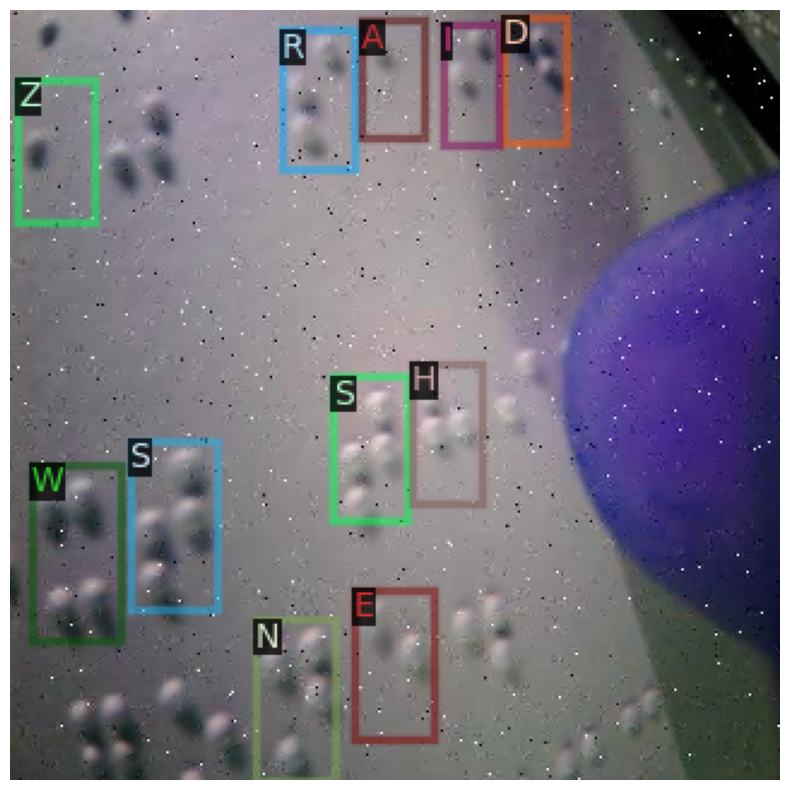

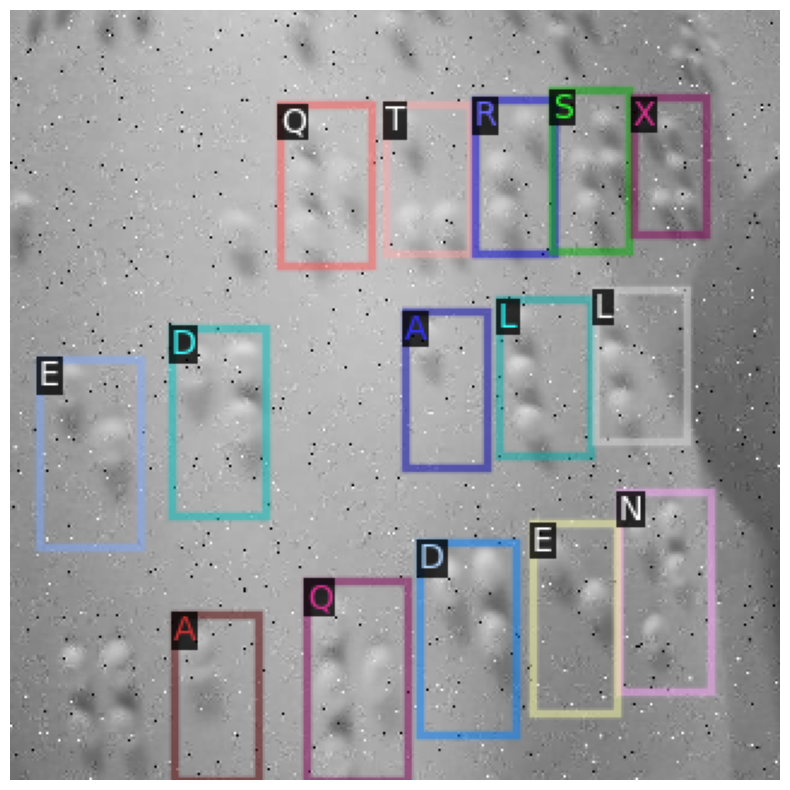

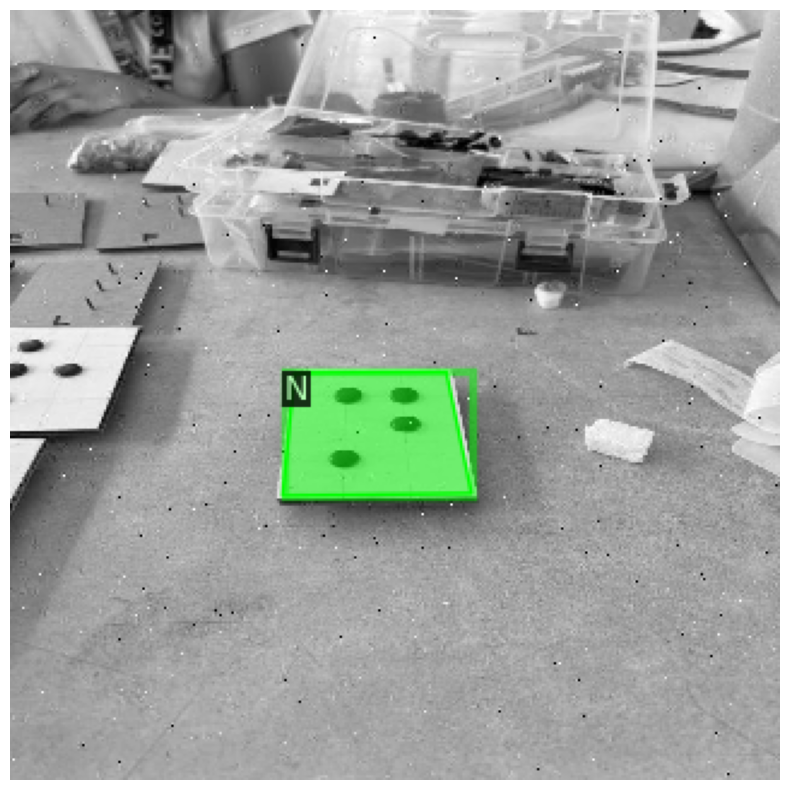

In [ ]:
# 필요한 라이브러리 임포트
import random
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

# 메타데이터 및 데이터셋 가져오기
my_dataset_train_metadata = MetadataCatalog.get("my_dataset_train")
dataset_dicts = DatasetCatalog.get("my_dataset_train")

# 임의의 샘플 데이터 시각화
for d in random.sample(dataset_dicts, 3):
    img = cv2.imread(d["file_name"])
    if img is not None:
        visualizer = Visualizer(img[:, :, ::-1], metadata=my_dataset_train_metadata, scale=0.5)
        vis = visualizer.draw_dataset_dict(d)
        # matplotlib를 사용하여 이미지를 표시합니다.
        plt.figure(figsize=(10, 10))
        plt.imshow(vis.get_image()[:, :, ::-1])
        plt.axis('off')
        plt.show()
    else:
        print(f"Image {d['file_name']} could not be read")


# Train 진행

## 1. Yolov5를 이용한 Train 진행

In [ ]:
# 사용할 데이터셋 경로 및 데이터셋의 yaml파일 경로 지정
data_dir = '/content/drive/MyDrive/braillev5'
data_yaml = '/content/drive/MyDrive/braillev5/data.yaml'

In [ ]:
import yaml

with open(data_yaml) as f:
  film = yaml.load(f, Loader=yaml.FullLoader)
  display(film)

NameError: name 'data_yaml' is not defined

In [ ]:
import yaml
# YAML 파일의 경로를 지정
data_yaml = '/content/drive/MyDrive/braillev5/data.yaml'

# YAML 파일을 로드
with open(data_yaml, 'r') as file:
    data = yaml.safe_load(file)

# 'val' 키 삭제
if 'valid' in data:
    del data['valid']

# 변경된 데이터를 다시 YAML 파일로 저장
with open(data_yaml, 'w') as file:
    yaml.dump(data, file, default_flow_style=False)

# 변경된 내용을 확인하기 위해 YAML 파일을 다시 로드하고 출력
with open(data_yaml, 'r') as file:
    updated_data = yaml.safe_load(file)
    print(updated_data)

FileNotFoundError: [Errno 2] No such file or directory: '/content/drive/MyDrive/braillev5/data.yaml'

In [ ]:
# yaml파일의 train, val 데이터가 있는  경로 수정(기본 경로 -> 드라이브 경로)
film['train'] = '/content/drive/MyDrive/braillev5/train/images'
film['val'] = '/content/drive/MyDrive/braillev5/valid/images'
film['test'] = '/content/drive/MyDrive/braillev5/test/images'

with open(data_yaml, 'w') as f:
  yaml.dump(film, f)

print('변경된 yaml 파일:')
with open(data_yaml) as f:
  film = yaml.load(f, Loader=yaml.FullLoader)
  display(film)

변경된 yaml 파일:


{'names': ['A',
  'B',
  'C',
  'D',
  'E',
  'F',
  'G',
  'H',
  'I',
  'J',
  'K',
  'L',
  'M',
  'N',
  'O',
  'P',
  'Q',
  'R',
  'S',
  'T',
  'U',
  'V',
  'W',
  'X',
  'Y',
  'Z'],
 'nc': 26,
 'roboflow': {'license': 'CC BY 4.0',
  'project': 'braillify',
  'url': 'https://universe.roboflow.com/nicco-van-hamja-b1vxy/braillify/dataset/1',
  'version': 1,
  'workspace': 'nicco-van-hamja-b1vxy'},
 'test': '/content/drive/MyDrive/braillev5/test/images',
 'train': '/content/drive/MyDrive/braillev5/train/images',
 'val': '/content/drive/MyDrive/braillev5/valid/images'}

In [ ]:
# yolov5를 이용한 커스텀 데이터 학습

%cd /content/drive/MyDrive/yolov5
!python train.py --device 0 --img 640 --batch 16 --epochs 250 --data /content/drive/MyDrive/braillev5/data.yaml --weights /content/drive/MyDrive/yolov5/runs/train/exp3/weights/last.pt --cache

/content/drive/MyDrive/yolov5
2024-05-15 16:28:09.375649: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-05-15 16:28:09.375696: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-05-15 16:28:09.377073: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-05-15 16:28:10.552714: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
train: weights=/content/drive/MyDrive/yolov5/runs/train/exp3/weights/last.pt, cfg=, data=/content/drive/MyDrive/braillev5/data.yaml, hyp=data/hyps/hyp.scratch-low.yaml, epochs=250, batch_size=16, imgsz=640, rect

## 2. Yolov8을 이용한 학습 진행

In [ ]:
%cd /home/user/cv/yolov8/

/home/user/cv/yolov8


In [ ]:
!pip install ultralytics

Defaulting to user installation because normal site-packages is not writeable


In [ ]:
import ultralytics

ultralytics.checks()

Ultralytics YOLOv8.2.18 🚀 Python-3.10.12 torch-2.1.2+cu118 CUDA:0 (NVIDIA GeForce RTX 4090, 24208MiB)
Setup complete ✅ (16 CPUs, 31.1 GB RAM, 80.7/467.9 GB disk)


In [ ]:
from ultralytics import YOLO

model = YOLO('yolov8m.pt')

 47%|████▋     | 23.4M/49.7M [00:13<00:15, 1.81MB/s]


KeyboardInterrupt: 

In [ ]:
# 학습시키기
from ultralytics import YOLO

model = YOLO('/home/user/cv/yolov8/yolov8m')
model.train(data='/home/user/cv/braillev8/data.yaml', epochs = 150, patience=30, batch=16, imgsz=640)

Ultralytics YOLOv8.2.18 🚀 Python-3.10.12 torch-2.1.2+cu118 CUDA:0 (NVIDIA GeForce RTX 4090, 24208MiB)
engine/trainer: task=detect, mode=train, model=/home/user/cv/yolov8/yolov8m.pt, data=/home/user/cv/braillev8/data.yaml, epochs=150, time=None, patience=30, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fal

100%|██████████| 6.23M/6.23M [00:03<00:00, 1.89MB/s]


AMP: checks passed ✅


train: Scanning /home/user/cv/braillev8/train/labels.cache... 3514 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3514/3514 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 1362, len(boxes) = 63896. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.



val: Scanning /home/user/cv/braillev8/valid/labels.cache... 206 images, 0 backgrounds, 0 corrupt: 100%|██████████| 206/206 [00:00<?, ?it/s]

WARNING ⚠️ Box and segment counts should be equal, but got len(segments) = 17, len(boxes) = 2954. To resolve this only boxes will be used and all segments will be removed. To avoid this please supply either a detect or segment dataset, not a detect-segment mixed dataset.


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.000333, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 8 dataloader workers
Logging results to runs/detect/train
Starting training for 150 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/150      7.75G      1.745      2.701      1.475        233        640: 100%|██████████| 220/220 [00:24<00:00,  8.96it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  8.14it/s]

                   all        206       2954      0.648       0.73       0.74      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/150      7.47G      1.208       1.22      1.144        229        640: 100%|██████████| 220/220 [00:23<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.14it/s]

                   all        206       2954      0.799      0.795       0.86      0.597



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/150      7.47G      1.139      1.028      1.115        366        640: 100%|██████████| 220/220 [00:23<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.29it/s]

                   all        206       2954      0.809      0.864      0.893      0.625



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/150       7.7G       1.09     0.9228      1.088        355        640: 100%|██████████| 220/220 [00:23<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.47it/s]

                   all        206       2954      0.809      0.896      0.899      0.648



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/150      7.45G      1.055     0.8705      1.073        182        640: 100%|██████████| 220/220 [00:23<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.42it/s]

                   all        206       2954      0.835      0.919      0.926      0.681



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/150      8.74G      1.029     0.8139      1.063        342        640: 100%|██████████| 220/220 [00:23<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]

                   all        206       2954      0.825      0.919      0.921      0.679



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/150      7.58G      1.008     0.7698      1.049        242        640: 100%|██████████| 220/220 [00:22<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.59it/s]

                   all        206       2954      0.881      0.908      0.941      0.698



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/150      7.74G     0.9884      0.748      1.036        176        640: 100%|██████████| 220/220 [00:23<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.97it/s]

                   all        206       2954      0.853      0.938      0.935      0.689



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/150      7.55G     0.9654     0.7074      1.025        308        640: 100%|██████████| 220/220 [00:24<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.50it/s]

                   all        206       2954      0.881      0.944      0.951      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/150      7.41G     0.9612     0.6907      1.021        217        640: 100%|██████████| 220/220 [00:23<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.67it/s]

                   all        206       2954      0.904       0.93      0.955      0.708



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/150      7.55G     0.9484     0.6717      1.017        362        640: 100%|██████████| 220/220 [00:22<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.78it/s]

                   all        206       2954      0.916      0.953      0.963      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/150      7.64G      0.932     0.6555      1.009        313        640: 100%|██████████| 220/220 [00:22<00:00,  9.69it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.91it/s]

                   all        206       2954      0.918      0.958      0.968      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/150      7.79G     0.9213     0.6316      1.005        311        640: 100%|██████████| 220/220 [00:22<00:00,  9.98it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.36it/s]

                   all        206       2954      0.928      0.933      0.965      0.734



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/150      7.46G     0.9117     0.6238     0.9961        282        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.95it/s]

                   all        206       2954      0.901      0.965      0.968      0.736



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/150      7.68G     0.8985     0.6032       0.99        244        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.51it/s]

                   all        206       2954      0.922      0.943      0.964      0.732



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/150      7.98G     0.8884     0.5979     0.9863        376        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.38it/s]

                   all        206       2954      0.899      0.947      0.957      0.729



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/150      7.86G     0.8797     0.5863     0.9822        257        640: 100%|██████████| 220/220 [00:22<00:00,  9.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.19it/s]

                   all        206       2954      0.946      0.954      0.976      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/150      7.64G      0.876     0.5848     0.9805        288        640: 100%|██████████| 220/220 [00:23<00:00,  9.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.49it/s]

                   all        206       2954       0.92      0.957      0.971      0.741



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/150      7.43G     0.8606     0.5698      0.975        284        640: 100%|██████████| 220/220 [00:23<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.49it/s]

                   all        206       2954      0.937      0.956      0.978      0.753



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/150      7.66G     0.8513     0.5594     0.9686        201        640: 100%|██████████| 220/220 [00:23<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.69it/s]

                   all        206       2954      0.931      0.963      0.974      0.749



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/150      8.18G     0.8411     0.5447     0.9648        218        640: 100%|██████████| 220/220 [00:23<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.05it/s]

                   all        206       2954      0.935      0.954      0.977      0.759



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/150      7.04G     0.8392     0.5432     0.9662        244        640: 100%|██████████| 220/220 [00:22<00:00,  9.72it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.01it/s]

                   all        206       2954      0.923      0.951      0.972      0.752



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/150      8.04G     0.8322      0.539     0.9623        174        640: 100%|██████████| 220/220 [00:22<00:00,  9.63it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.08it/s]

                   all        206       2954      0.928      0.974      0.978      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/150      8.01G     0.8199      0.522     0.9546        216        640: 100%|██████████| 220/220 [00:23<00:00,  9.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.65it/s]

                   all        206       2954      0.923      0.962      0.968      0.746



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/150      7.59G     0.8142     0.5212     0.9518        168        640: 100%|██████████| 220/220 [00:23<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.49it/s]

                   all        206       2954      0.924      0.963      0.976      0.758



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/150      7.33G     0.8042     0.5178     0.9502        349        640: 100%|██████████| 220/220 [00:23<00:00,  9.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.93it/s]

                   all        206       2954      0.923      0.973       0.98      0.761



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/150      7.55G     0.7961     0.5025     0.9484        256        640: 100%|██████████| 220/220 [00:23<00:00,  9.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.46it/s]

                   all        206       2954      0.949      0.963      0.983      0.765



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/150      8.19G     0.7838     0.4911      0.941        299        640: 100%|██████████| 220/220 [00:23<00:00,  9.31it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.58it/s]

                   all        206       2954      0.929       0.97      0.979      0.762



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/150       7.4G     0.7801     0.4949     0.9394        221        640: 100%|██████████| 220/220 [00:23<00:00,  9.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.63it/s]

                   all        206       2954      0.946      0.961      0.979      0.764



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/150      7.64G     0.7778     0.4942     0.9392        287        640: 100%|██████████| 220/220 [00:23<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.77it/s]

                   all        206       2954      0.935       0.97      0.977      0.766



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/150      7.57G     0.7741      0.485     0.9388        248        640: 100%|██████████| 220/220 [00:23<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.75it/s]

                   all        206       2954       0.94      0.967      0.977      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/150       7.9G     0.7615     0.4739     0.9328        262        640: 100%|██████████| 220/220 [00:23<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.83it/s]

                   all        206       2954       0.94      0.969      0.978      0.768



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/150      7.04G     0.7534      0.469      0.928        252        640: 100%|██████████| 220/220 [00:23<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.65it/s]

                   all        206       2954      0.927      0.979      0.978      0.767



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/150      7.57G     0.7495     0.4689     0.9278        177        640: 100%|██████████| 220/220 [00:23<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.73it/s]

                   all        206       2954      0.934      0.969       0.98      0.772



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/150      8.18G     0.7386      0.459     0.9219        266        640: 100%|██████████| 220/220 [00:23<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.84it/s]

                   all        206       2954      0.943       0.96      0.978       0.76



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/150      7.41G     0.7388     0.4634     0.9248        240        640: 100%|██████████| 220/220 [00:23<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.73it/s]

                   all        206       2954      0.917      0.978      0.978      0.769



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/150      7.64G      0.728     0.4507       0.92        417        640: 100%|██████████| 220/220 [00:23<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.64it/s]

                   all        206       2954       0.94      0.968       0.98      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/150      8.15G       0.72     0.4503     0.9159        274        640: 100%|██████████| 220/220 [00:23<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.84it/s]

                   all        206       2954      0.939      0.974      0.981      0.776



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/150      7.54G     0.7168     0.4448     0.9162        287        640: 100%|██████████| 220/220 [00:23<00:00,  9.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.83it/s]

                   all        206       2954      0.947      0.968      0.981      0.778



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/150      7.38G     0.7097     0.4408     0.9166        239        640: 100%|██████████| 220/220 [00:23<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.77it/s]

                   all        206       2954      0.945      0.959      0.977      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/150      8.85G     0.7097     0.4451     0.9175        189        640: 100%|██████████| 220/220 [00:23<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]

                   all        206       2954      0.936      0.967      0.976      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/150      7.35G     0.7045     0.4353     0.9142        206        640: 100%|██████████| 220/220 [00:23<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.40it/s]

                   all        206       2954      0.945      0.957      0.976      0.779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/150      7.21G     0.6957     0.4323     0.9102        164        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.57it/s]

                   all        206       2954      0.942       0.97       0.98      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/150      7.71G     0.6923      0.433     0.9083        176        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.60it/s]

                   all        206       2954      0.924      0.975      0.977      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/150      7.07G     0.6932     0.4293      0.911        233        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.50it/s]

                   all        206       2954      0.944      0.956      0.978      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/150      8.22G     0.6803     0.4252      0.907        173        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.54it/s]

                   all        206       2954      0.939      0.968      0.978      0.777



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/150      7.98G     0.6812     0.4218     0.9048        259        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.56it/s]

                   all        206       2954      0.938      0.963      0.976      0.773



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/150      7.57G     0.6723     0.4188     0.9038        394        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.44it/s]

                   all        206       2954      0.945      0.965      0.978      0.782



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/150      6.86G     0.6732     0.4159     0.9021        211        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.46it/s]

                   all        206       2954      0.927      0.969      0.974      0.774



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/150      7.33G     0.6667     0.4181     0.9008        239        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.63it/s]

                   all        206       2954      0.932      0.957      0.973       0.78



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/150      7.16G     0.6548     0.4083     0.8945        252        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.54it/s]

                   all        206       2954      0.934      0.977      0.978      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/150      7.01G     0.6554     0.4101     0.8971        235        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.53it/s]

                   all        206       2954       0.93      0.971      0.977      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/150      7.28G     0.6464     0.3989     0.8945        190        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.65it/s]

                   all        206       2954      0.945      0.964      0.977      0.785



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/150      7.88G     0.6399     0.3986     0.8944        301        640: 100%|██████████| 220/220 [00:21<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.49it/s]

                   all        206       2954      0.938      0.969      0.977      0.781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/150      7.89G     0.6404      0.396     0.8929        279        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.59it/s]

                   all        206       2954      0.941      0.966      0.976      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/150      7.32G      0.629     0.3901     0.8883        264        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.52it/s]

                   all        206       2954      0.952      0.965      0.978      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/150      7.48G     0.6287     0.3915     0.8902        247        640: 100%|██████████| 220/220 [00:21<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.52it/s]

                   all        206       2954      0.945      0.974      0.975      0.784



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/150      7.33G     0.6238     0.3905     0.8846        435        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.63it/s]

                   all        206       2954      0.929      0.975      0.977      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/150      7.33G      0.619     0.3839     0.8827        194        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.62it/s]

                   all        206       2954       0.95      0.967      0.979      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/150      7.62G     0.6129     0.3814     0.8833        219        640: 100%|██████████| 220/220 [00:21<00:00, 10.14it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.56it/s]

                   all        206       2954      0.952      0.968       0.98      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/150      7.33G     0.6037     0.3736     0.8784        176        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.60it/s]

                   all        206       2954      0.955      0.957      0.978      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/150      7.38G     0.6032     0.3792     0.8813        319        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.44it/s]

                   all        206       2954      0.941      0.973      0.978      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/150      7.69G     0.5926     0.3699     0.8775        197        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.55it/s]

                   all        206       2954      0.941      0.965      0.978      0.787



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/150       7.5G     0.5893     0.3671     0.8741        333        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.55it/s]

                   all        206       2954      0.954      0.965      0.979      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/150      7.57G     0.5882     0.3645      0.875        206        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.58it/s]

                   all        206       2954       0.95      0.971      0.981      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/150       7.7G     0.5982     0.3735     0.8804        265        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.45it/s]

                   all        206       2954      0.941      0.964      0.977       0.79



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/150      8.33G     0.5908      0.366     0.8784        257        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.63it/s]

                   all        206       2954      0.946      0.956      0.977      0.788



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/150      7.39G     0.5839     0.3675     0.8748        282        640: 100%|██████████| 220/220 [00:21<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.52it/s]

                   all        206       2954      0.952      0.958       0.98      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/150      7.18G     0.5828       0.36      0.874        398        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.53it/s]

                   all        206       2954      0.947      0.953      0.973      0.786



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/150      7.61G     0.5791     0.3643     0.8754        249        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.56it/s]

                   all        206       2954      0.952      0.959       0.98      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/150       7.4G     0.5718       0.36     0.8707        356        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.41it/s]

                   all        206       2954      0.948      0.966      0.979      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/150      7.75G     0.5744     0.3592     0.8711        207        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.56it/s]

                   all        206       2954      0.962      0.949      0.978      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/150      7.41G     0.5702     0.3583     0.8715        183        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.54it/s]

                   all        206       2954      0.958      0.959      0.976      0.792



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/150      7.68G     0.5645     0.3506     0.8701        155        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.55it/s]

                   all        206       2954      0.939      0.967      0.975      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/150      7.85G     0.5606      0.352     0.8678        219        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.51it/s]

                   all        206       2954      0.953      0.962      0.977      0.793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/150      7.36G     0.5532     0.3455     0.8651        143        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.62it/s]

                   all        206       2954      0.948      0.964      0.977      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/150      7.63G     0.5504     0.3428     0.8647        234        640: 100%|██████████| 220/220 [00:21<00:00, 10.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.53it/s]

                   all        206       2954      0.949      0.962      0.977      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/150      7.24G     0.5512     0.3504     0.8676        194        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.47it/s]

                   all        206       2954      0.949      0.962      0.976      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/150      7.45G     0.5496     0.3432     0.8652        259        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.60it/s]

                   all        206       2954      0.953      0.959      0.978      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/150      7.36G     0.5434     0.3437     0.8642        290        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.58it/s]

                   all        206       2954       0.95      0.964      0.978      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/150      7.57G     0.5365     0.3401     0.8614        183        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.55it/s]

                   all        206       2954      0.956      0.952      0.976      0.795



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/150      7.69G     0.5417     0.3436     0.8621        362        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.55it/s]

                   all        206       2954      0.941      0.967      0.978      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/150      7.51G     0.5332     0.3353     0.8613        230        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.49it/s]

                   all        206       2954      0.933      0.974      0.975      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/150      7.59G     0.5311     0.3341     0.8602        172        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.50it/s]

                   all        206       2954      0.941      0.971      0.978        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/150      8.35G     0.5294     0.3373      0.858        272        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.57it/s]

                   all        206       2954      0.944      0.964      0.974      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/150      7.49G     0.5334     0.3369     0.8613        210        640: 100%|██████████| 220/220 [00:21<00:00, 10.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.47it/s]

                   all        206       2954      0.947      0.963      0.975      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/150      7.64G     0.5228     0.3284     0.8595        295        640: 100%|██████████| 220/220 [00:21<00:00, 10.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.55it/s]

                   all        206       2954      0.948      0.968      0.976      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/150      7.96G     0.5161     0.3275     0.8573        185        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.53it/s]

                   all        206       2954      0.939      0.968      0.976      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/150      7.48G     0.5255      0.333     0.8591        403        640: 100%|██████████| 220/220 [00:21<00:00, 10.10it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.58it/s]

                   all        206       2954      0.944      0.969      0.975      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/150      7.58G      0.516     0.3319     0.8547        281        640: 100%|██████████| 220/220 [00:23<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.61it/s]

                   all        206       2954       0.95      0.956      0.975      0.794



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/150      7.72G      0.515     0.3281     0.8561        266        640: 100%|██████████| 220/220 [00:23<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.65it/s]

                   all        206       2954      0.945      0.969      0.975      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/150       7.7G     0.5103     0.3226     0.8526        220        640: 100%|██████████| 220/220 [00:23<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.42it/s]

                   all        206       2954      0.951      0.962      0.976      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/150      7.94G     0.5068     0.3191     0.8522        367        640: 100%|██████████| 220/220 [00:23<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.76it/s]

                   all        206       2954      0.944      0.965      0.971      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/150      7.97G     0.5078     0.3208     0.8535        235        640: 100%|██████████| 220/220 [00:23<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.90it/s]

                   all        206       2954      0.939      0.969      0.974      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/150      7.33G     0.4985     0.3149     0.8536        346        640: 100%|██████████| 220/220 [00:23<00:00,  9.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.28it/s]

                   all        206       2954      0.939      0.968      0.971      0.797



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/150      7.68G     0.5018      0.317     0.8518        237        640: 100%|██████████| 220/220 [00:23<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.96it/s]

                   all        206       2954      0.949       0.96      0.975      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/150      7.74G     0.4977     0.3175     0.8512        292        640: 100%|██████████| 220/220 [00:23<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.71it/s]

                   all        206       2954       0.94      0.968      0.972      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/150       7.3G     0.4942     0.3169     0.8491        302        640: 100%|██████████| 220/220 [00:23<00:00,  9.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.46it/s]

                   all        206       2954      0.929      0.975      0.971      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/150      7.83G     0.4888     0.3168      0.849        230        640: 100%|██████████| 220/220 [00:23<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.59it/s]

                   all        206       2954      0.938      0.967      0.973      0.796



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/150      7.33G     0.4918     0.3152     0.8508        180        640: 100%|██████████| 220/220 [00:23<00:00,  9.34it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.58it/s]

                   all        206       2954      0.939      0.966      0.974        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/150      7.47G     0.4858     0.3086     0.8468        177        640: 100%|██████████| 220/220 [00:23<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.58it/s]

                   all        206       2954      0.949       0.96      0.971      0.798



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/150      7.67G     0.4886      0.311     0.8487        204        640: 100%|██████████| 220/220 [00:23<00:00,  9.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.79it/s]

                   all        206       2954      0.953      0.953       0.97      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/150      7.87G      0.486     0.3049     0.8456        309        640: 100%|██████████| 220/220 [00:23<00:00,  9.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.71it/s]

                   all        206       2954      0.943       0.97      0.973        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/150       7.4G     0.4789     0.3057     0.8454        195        640: 100%|██████████| 220/220 [00:23<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.43it/s]

                   all        206       2954      0.941      0.969      0.971      0.799



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/150      7.62G     0.4752     0.3036     0.8467        240        640: 100%|██████████| 220/220 [00:23<00:00,  9.41it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.01it/s]

                   all        206       2954      0.947      0.964      0.971      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/150      7.31G     0.4797     0.3077     0.8472        159        640: 100%|██████████| 220/220 [00:24<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.26it/s]

                   all        206       2954      0.945      0.968       0.97      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/150      7.29G     0.4726     0.3021     0.8428        250        640: 100%|██████████| 220/220 [00:23<00:00,  9.24it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.67it/s]

                   all        206       2954      0.948      0.963      0.975      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/150      7.35G     0.4686     0.3008     0.8444        235        640: 100%|██████████| 220/220 [00:23<00:00,  9.42it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.65it/s]

                   all        206       2954      0.952      0.956      0.975      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/150      7.66G     0.4658     0.2996      0.843        208        640: 100%|██████████| 220/220 [00:23<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.83it/s]

                   all        206       2954      0.941      0.965      0.975      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/150      7.69G     0.4614     0.2963     0.8409        331        640: 100%|██████████| 220/220 [00:23<00:00,  9.29it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.29it/s]

                   all        206       2954       0.95      0.959      0.975      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/150      7.69G     0.4661     0.2966     0.8432        203        640: 100%|██████████| 220/220 [00:23<00:00,  9.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.69it/s]

                   all        206       2954      0.944      0.967      0.976      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/150      7.32G     0.4631     0.2962      0.841        235        640: 100%|██████████| 220/220 [00:23<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.57it/s]

                   all        206       2954      0.942      0.965      0.973      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/150      7.32G     0.4585     0.2941     0.8397        318        640: 100%|██████████| 220/220 [00:23<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.18it/s]

                   all        206       2954      0.948      0.966      0.976      0.804



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/150      7.59G     0.4577     0.2944     0.8399        221        640: 100%|██████████| 220/220 [00:23<00:00,  9.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.29it/s]

                   all        206       2954      0.952      0.957      0.975      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/150      7.64G     0.4545     0.2937     0.8408        219        640: 100%|██████████| 220/220 [00:23<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.00it/s]

                   all        206       2954       0.94       0.97      0.972        0.8



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/150      7.41G     0.4517     0.2901     0.8384        210        640: 100%|██████████| 220/220 [00:23<00:00,  9.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]

                   all        206       2954      0.946       0.96      0.971      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/150      7.35G     0.4505     0.2909     0.8393        310        640: 100%|██████████| 220/220 [00:23<00:00,  9.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.96it/s]

                   all        206       2954      0.947      0.959      0.972      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/150      7.57G     0.4499     0.2872     0.8383        296        640: 100%|██████████| 220/220 [00:23<00:00,  9.30it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.42it/s]

                   all        206       2954      0.945      0.959       0.97      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/150      7.16G     0.4482     0.2904     0.8399        192        640: 100%|██████████| 220/220 [00:23<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.42it/s]

                   all        206       2954      0.937       0.97      0.973      0.801



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/150      7.74G     0.4437     0.2881     0.8375        368        640: 100%|██████████| 220/220 [00:23<00:00,  9.22it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.09it/s]

                   all        206       2954      0.953      0.957      0.972      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/150       7.3G     0.4424     0.2842     0.8368        293        640: 100%|██████████| 220/220 [00:24<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.95it/s]

                   all        206       2954      0.944      0.962      0.971      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/150      7.93G     0.4383      0.285     0.8364        259        640: 100%|██████████| 220/220 [00:24<00:00,  8.97it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.96it/s]

                   all        206       2954      0.944      0.964       0.97      0.803



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/150      7.85G      0.443     0.2892     0.8388        155        640: 100%|██████████| 220/220 [00:23<00:00,  9.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.98it/s]

                   all        206       2954      0.953      0.956      0.971      0.802



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/150      7.17G     0.4327     0.2821     0.8344        283        640: 100%|██████████| 220/220 [00:24<00:00,  8.94it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.85it/s]

                   all        206       2954      0.959      0.952      0.973      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/150      7.76G     0.4351     0.2804     0.8337        291        640: 100%|██████████| 220/220 [00:24<00:00,  9.11it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.06it/s]

                   all        206       2954      0.938      0.973      0.973      0.805



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/150      7.36G     0.4332     0.2788     0.8336        337        640: 100%|██████████| 220/220 [00:22<00:00,  9.66it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.82it/s]

                   all        206       2954      0.938      0.972      0.972      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/150      7.83G     0.4325     0.2799     0.8348        281        640: 100%|██████████| 220/220 [00:24<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.12it/s]

                   all        206       2954      0.956      0.955      0.976      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/150      7.91G     0.4274     0.2804      0.834        207        640: 100%|██████████| 220/220 [00:24<00:00,  9.05it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.91it/s]

                   all        206       2954      0.958      0.955      0.975      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/150      7.53G     0.4257     0.2766     0.8327        512        640: 100%|██████████| 220/220 [00:24<00:00,  8.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.87it/s]

                   all        206       2954      0.953      0.958      0.974      0.806



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/150      7.07G     0.4256     0.2747     0.8332        199        640: 100%|██████████| 220/220 [00:23<00:00,  9.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.41it/s]

                   all        206       2954      0.954      0.958      0.976       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/150      7.93G     0.4252     0.2784      0.833        225        640: 100%|██████████| 220/220 [00:23<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.81it/s]

                   all        206       2954      0.948      0.962      0.973      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/150      8.07G     0.4219     0.2768     0.8314        304        640: 100%|██████████| 220/220 [00:22<00:00,  9.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.64it/s]

                   all        206       2954      0.952      0.958      0.975      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/150      7.38G     0.4182     0.2745     0.8317        244        640: 100%|██████████| 220/220 [00:23<00:00,  9.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.79it/s]

                   all        206       2954      0.949       0.96      0.973      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/150      7.94G      0.415     0.2707     0.8306        274        640: 100%|██████████| 220/220 [00:24<00:00,  9.06it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.44it/s]

                   all        206       2954      0.948      0.962      0.974      0.808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/150      7.68G     0.4168     0.2734     0.8299        185        640: 100%|██████████| 220/220 [00:24<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.35it/s]

                   all        206       2954       0.95      0.959      0.973      0.807



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/150      7.87G     0.4153     0.2699      0.831        183        640: 100%|██████████| 220/220 [00:24<00:00,  9.09it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.37it/s]

                   all        206       2954      0.951      0.959      0.975       0.81



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/150      7.02G     0.4125     0.2678     0.8296        250        640: 100%|██████████| 220/220 [00:24<00:00,  9.12it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.52it/s]

                   all        206       2954      0.954       0.96      0.975      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/150      7.05G     0.4112     0.2653     0.8293        355        640: 100%|██████████| 220/220 [00:24<00:00,  9.13it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.17it/s]

                   all        206       2954      0.943      0.971      0.973      0.809



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/150      7.63G     0.4093     0.2688     0.8286        222        640: 100%|██████████| 220/220 [00:24<00:00,  9.03it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.33it/s]

                   all        206       2954      0.948      0.968      0.973      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/150      7.68G     0.4077     0.2682     0.8275        344        640: 100%|██████████| 220/220 [00:24<00:00,  8.85it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.33it/s]

                   all        206       2954      0.949      0.964      0.973      0.811


Closing dataloader mosaic

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/150      6.81G     0.3809     0.2314     0.8249        184        640: 100%|██████████| 220/220 [00:24<00:00,  9.08it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 11.05it/s]

                   all        206       2954      0.949      0.963      0.974      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/150      6.65G      0.367     0.2209     0.8203        150        640: 100%|██████████| 220/220 [00:23<00:00,  9.25it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.04it/s]

                   all        206       2954      0.949      0.965      0.975      0.811



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/150      6.82G     0.3595     0.2139     0.8162        161        640: 100%|██████████| 220/220 [00:24<00:00,  9.02it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.96it/s]

                   all        206       2954      0.948      0.966      0.975      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/150      6.82G     0.3545     0.2126     0.8143        198        640: 100%|██████████| 220/220 [00:24<00:00,  9.01it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00,  9.91it/s]

                   all        206       2954      0.946      0.968      0.975      0.812



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/150      6.71G      0.351     0.2132     0.8152        138        640: 100%|██████████| 220/220 [00:23<00:00,  9.27it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.36it/s]

                   all        206       2954      0.947      0.969      0.975      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/150      6.82G     0.3492     0.2101     0.8136        193        640: 100%|██████████| 220/220 [00:22<00:00,  9.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.66it/s]

                   all        206       2954      0.947      0.971      0.975      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/150       6.7G       0.35     0.2113     0.8148        192        640: 100%|██████████| 220/220 [00:23<00:00,  9.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.77it/s]

                   all        206       2954      0.943      0.973      0.975      0.814



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/150      6.79G     0.3464     0.2125     0.8136        223        640: 100%|██████████| 220/220 [00:23<00:00,  9.33it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.52it/s]

                   all        206       2954      0.943      0.974      0.975      0.815



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/150      6.81G     0.3473     0.2125     0.8139        163        640: 100%|██████████| 220/220 [00:23<00:00,  9.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 7/7 [00:00<00:00, 10.83it/s]

                   all        206       2954      0.944      0.973      0.976      0.816


FileNotFoundError: [Errno 2] No such file or directory: 'runs/detect/train/results.csv'

## 3. Faster R-CNN을 이용한 학습 진행

In [ ]:
pwd

'/content/drive/MyDrive/cv/FRcnn'

In [ ]:
#We are importing our own Trainer Module here to use the COCO validation evaluation during training. Otherwise no validation eval occurs.

from detectron2.engine import DefaultTrainer
from detectron2.evaluation import COCOEvaluator

class CocoTrainer(DefaultTrainer):

  @classmethod
  def build_evaluator(cls, cfg, dataset_name, output_folder=None):

    if output_folder is None:
        os.makedirs("coco_eval", exist_ok=True)
        output_folder = "coco_eval"

    return COCOEvaluator(dataset_name, cfg, False, output_folder)

In [ ]:

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 2  # Adjust this based on the warning message
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x.yaml")
cfg.SOLVER.IMS_PER_BATCH = 2  # Adjust this based on your GPU memory
cfg.SOLVER.BASE_LR = 0.0025  # A good starting point, you may need to tune this

# Adjusting training schedule
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 32000  # Set to match the number of epochs used in YOLOv8
cfg.SOLVER.STEPS = (24000, 28000)  # Adjusting steps to match total iterations
cfg.SOLVER.GAMMA = 0.1

# ROI head batch size and number of classes
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # Increase batch size per image
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 27  # Set the number of classes in your dataset

# Evaluation period
cfg.TEST.EVAL_PERIOD = 5000

# Output directory
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Initialize the model
model = build_model(cfg)
DetectionCheckpointer(model).load(cfg.MODEL.WEIGHTS)

# Calculate number of parameters and FLOPs
from fvcore.nn import FlopCountAnalysis, parameter_count_table

inputs = [{"image": torch.randn(3, 800, 800), "instances": torch.tensor([1])}]  # Example input
flop_analysis = FlopCountAnalysis(model, inputs)
print(f"Total parameters:\n{parameter_count_table(model)}")
print(f"Total FLOPs: {flop_analysis.total()}")

# Initialize and start training
trainer = DefaultTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()

[05/27 00:54:45 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from https://dl.fbaipublicfiles.com/detectron2/COCO-Detection/faster_rcnn_X_101_32x8d_FPN_3x/139173657/model_final_68b088.pkl ...


roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


Total parameters:
| name                                             | #elements or shape   |
|:-------------------------------------------------|:---------------------|
| model                                            | 0.1G                 |
|  backbone                                        |  89.9M               |
|   backbone.fpn_lateral2                          |   65.8K              |
|    backbone.fpn_lateral2.weight                  |    (256, 256, 1, 1)  |
|    backbone.fpn_lateral2.bias                    |    (256,)            |
|   backbone.fpn_output2                           |   0.6M               |
|    backbone.fpn_output2.weight                   |    (256, 256, 3, 3)  |
|    backbone.fpn_output2.bias                     |    (256,)            |
|   backbone.fpn_lateral3                          |   0.1M               |
|    backbone.fpn_lateral3.weight                  |    (256, 512, 1, 1)  |
|    backbone.fpn_lateral3.bias                    |    (256,)        

AttributeError: 'Tensor' object has no attribute 'gt_boxes'

In [ ]:

# Configuration
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("my_dataset_train",)
cfg.DATASETS.TEST = ("my_dataset_val",)

cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-Detection/faster_rcnn_R_50_FPN_3x.yaml.yaml")
cfg.SOLVER.IMS_PER_BATCH = 4  # Adjust this based on your GPU memory
cfg.SOLVER.BASE_LR = 0.0025  # A good starting point, you may need to tune this

# Adjusting training schedule
cfg.SOLVER.WARMUP_ITERS = 1000
cfg.SOLVER.MAX_ITER = 32000  # Set to match the number of epochs used in YOLOv8
cfg.SOLVER.STEPS = (24000, 28000)  # Adjusting steps to match total iterations
cfg.SOLVER.GAMMA = 0.1

# ROI head batch size and number of classes
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 512  # Increase batch size per image
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 27  # Set the number of classes in your dataset

# Evaluation period
cfg.TEST.EVAL_PERIOD = 5000

# Output directory
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)

# Initialize and start training
trainer =CocoTrainer(cfg)
trainer.resume_or_load(resume=False)
trainer.train()


[05/27 01:02:03 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

/usr/local/lib/python3.10/dist-packages/torch/utils/data/dataloader.py:558: UserWarning: This DataLoader will create 4 worker processes in total. Our suggested max number of worker in current system is 2, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(
model_final_280758.pkl: 167MB [00:00, 207MB/s]                           
roi_heads.box_predictor.bbox_pred.{bias, weight}
roi_heads.box_predictor.cls_score.{bias, weight}


[05/27 01:02:04 d2.engine.train_loop]: Starting training from iteration 0
[05/27 01:02:16 d2.engine.hooks]: Overall training speed: 11 iterations in 0:00:08 (0.7878 s / it)
[05/27 01:02:16 d2.engine.hooks]: Total training time: 0:00:08 (0:00:00 on hooks)
[05/27 01:02:16 d2.utils.events]:  eta: 6:34:11  iter: 13  total_loss: 5.249  loss_cls: 3.461  loss_box_reg: 0.175  loss_rpn_cls: 1.621  loss_rpn_loc: 0.1099    time: 0.7230  last_time: 0.6173  data_time: 0.0681  last_data_time: 0.0170   lr: 3.247e-05  max_mem: 6359M


KeyboardInterrupt: 

# Tensorborad를 이용한 mAP 비교

In [ ]:
%cd /home/user/cv/yolov8/

# Start tensorboard
# Launch ager you have started training
# logs save in the floder "runs"
%load_ext tensorboard
%tensorboard --logdir runs

/home/user/cv/yolov8
The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


# Predict를 통한 이미지에서 점자 detect

### 1. yolov5

In [ ]:
# 1. yolov5를 이용한 detect - detect한 object의 라벨 정보를 txt파일로 저장

%cd /content/drive/MyDrive/yolov5
!python detect.py --source /content/drive/MyDrive/braillev5/test3.jpg --weights /content/drive/MyDrive/yolov5/runs/train/exp4/weights/best.pt --conf 0.4 --save-txt

[Errno 2] No such file or directory: '/content/drive/MyDrive/yolov5'
/home/user/cv/yolov8
/bin/bash: 줄 1: python: 명령어를 찾을 수 없음


### 2. yolov8

In [ ]:
pwd

'/home/user/cv'

In [ ]:
%cd /home/user/cv/yolov8/

from ultralytics import YOLO

# 2. yolov8을 이용한 detect
model = YOLO('/home/user/cv/yolov8/runs/detect/train2/weights/best.pt')

# YOLOv8 모델을 사용한 감지 작업에서 신뢰도 임계값 설정
results = model.predict(source='/home/user/cv/braillev8/test3.jpg', conf=0.1, save=True)

/home/user/cv/yolov8

image 1/1 /home/user/cv/braillev8/test3.jpg: 480x640 1 A, 2 Cs, 1 M, 2 Os, 1 R, 1 T, 1 W, 4.5ms
Speed: 1.4ms preprocess, 4.5ms inference, 0.6ms postprocess per image at shape (1, 3, 480, 640)
Results saved to runs/detect/predict9


### 3. Faster-Rcnn

In [ ]:
pwd

'/home/user/cv/FRcnn'

In [ ]:
#test evaluation
from detectron2.config import get_cfg
#from detectron2.evaluation.coco_evaluation import COCOEvaluator
import os
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join("/home/user/cv/FRcnn/output", "model_0004999.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7
predictor = DefaultPredictor(cfg)
evaluator = COCOEvaluator("my_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "my_dataset_test")
inference_on_dataset(trainer.model, val_loader, evaluator)

[05/22 13:02:39 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /home/user/cv/FRcnn/output/model_0004999.pth ...
WARNING [05/22 13:02:40 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [05/22 13:02:40 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[05/22 13:02:40 d2.data.datasets.coco]: Loaded 99 images in COCO format from /home/user/cv/brailleRcnn/test/_annotations.coco.json
[05/22 13:02:40 d2.data.build]: Distribution of instances among all 27 categories:
|  category  | #instances   |  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|:----------:|:-------------|
|  braille   | 0            |     A      | 93           |     B      | 23           |
|     C      | 36           |     D      | 72           |     E      | 182       

OrderedDict([('bbox',
              {'AP': 72.30021725336344,
               'AP50': 95.10404233639836,
               'AP75': 88.81470763651497,
               'APs': 65.04950495049505,
               'APm': 71.18303664389155,
               'APl': 82.63276137386029,
               'AP-braille': nan,
               'AP-A': 63.3485558103695,
               'AP-B': 61.077442828146324,
               'AP-C': 74.17845151429361,
               'AP-D': 74.87249056459787,
               'AP-E': 77.18857760643219,
               'AP-F': 69.07273048733444,
               'AP-G': 76.51658693277486,
               'AP-H': 74.65576415163639,
               'AP-I': 73.66124184230301,
               'AP-J': 77.85183875530412,
               'AP-K': 71.84609642282909,
               'AP-L': 73.08444871891481,
               'AP-M': 66.55852661256823,
               'AP-N': 69.08878255716321,
               'AP-O': 76.02794603026636,
               'AP-P': 71.46123183746946,
               'AP-Q': 79

In [ ]:
#test evaluation
from detectron2.data import DatasetCatalog, MetadataCatalog, build_detection_test_loader
from detectron2.evaluation import COCOEvaluator, inference_on_dataset

cfg.MODEL.WEIGHTS = os.path.join("/home/user/cv/FRcnn/output/", "model_0004999.pth")
cfg.DATASETS.TEST = ("my_dataset_test", )
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.7   # set the testing threshold for this model
predictor = DefaultPredictor(cfg)
test_metadata = MetadataCatalog.get("my_dataset_test")

[05/22 13:02:46 d2.checkpoint.detection_checkpoint]: [DetectionCheckpointer] Loading from /home/user/cv/FRcnn/output/model_0004999.pth ...


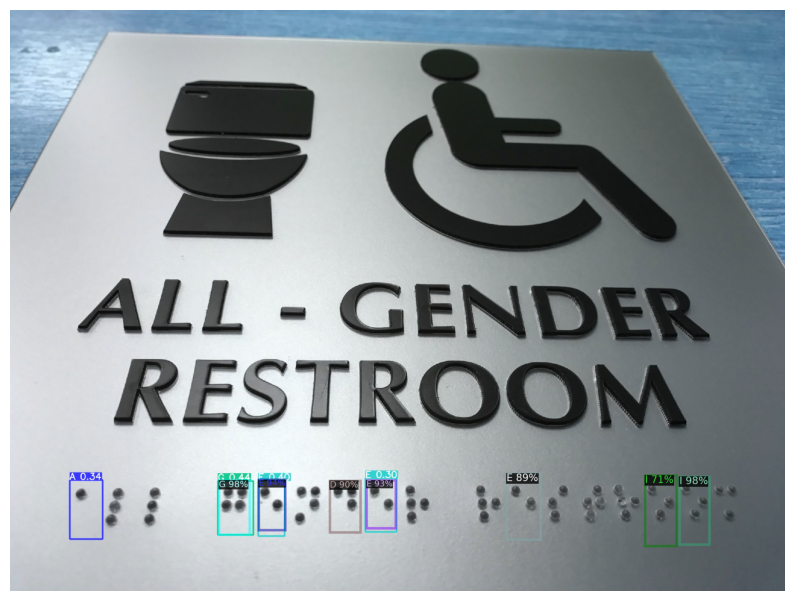

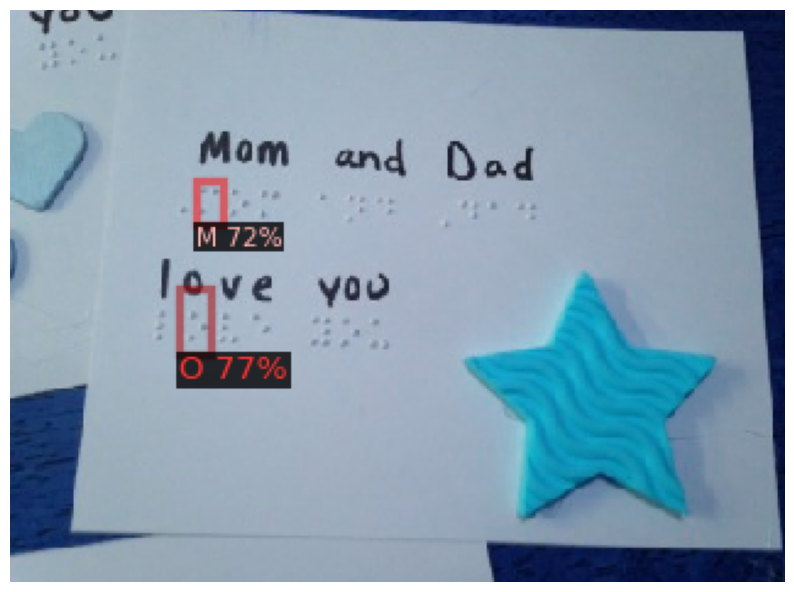

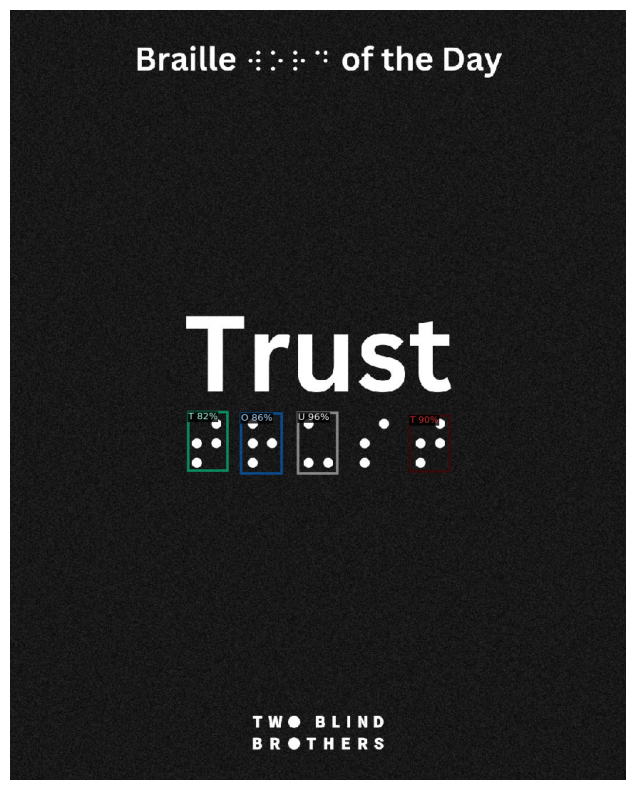

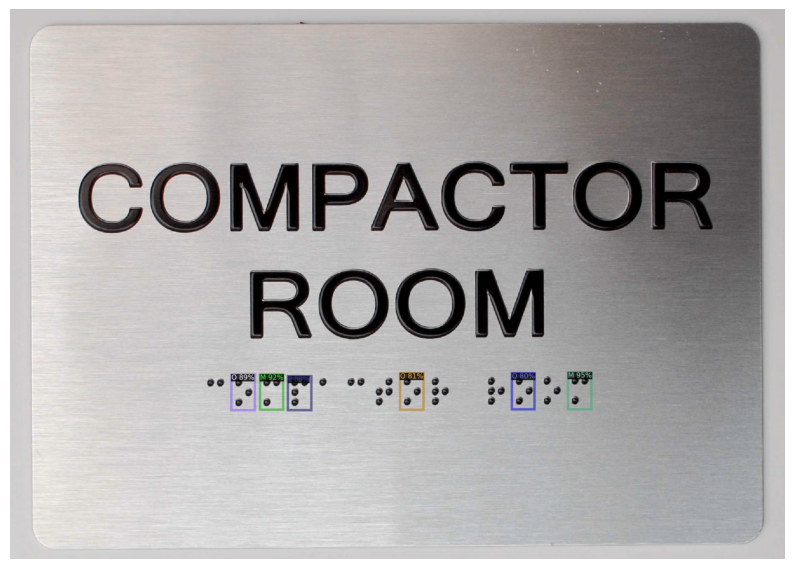

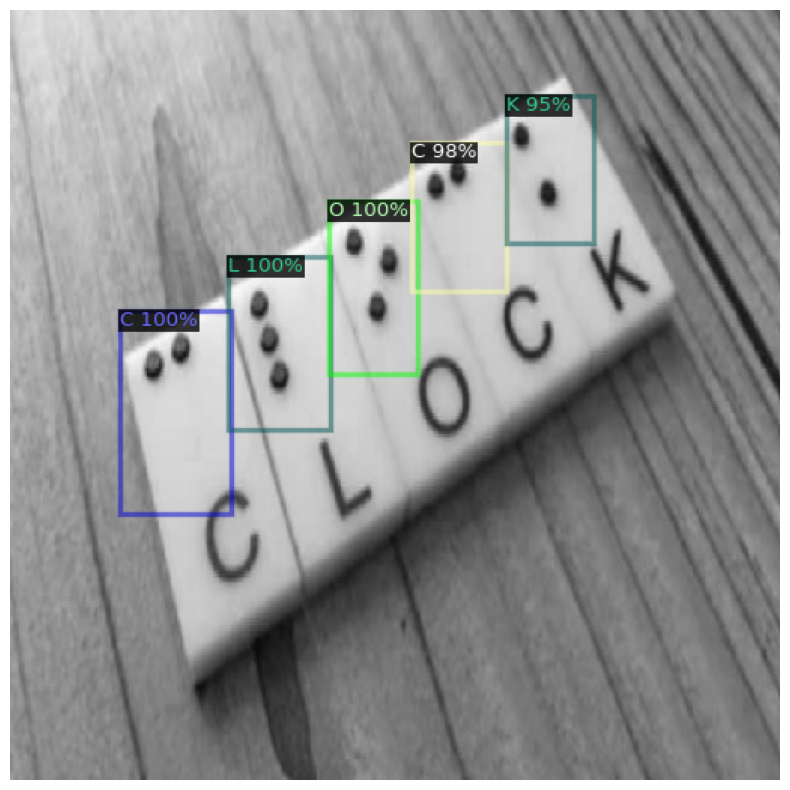

In [ ]:
import cv2
import matplotlib.pyplot as plt
from detectron2.utils.visualizer import Visualizer
from detectron2.utils.visualizer import ColorMode
import glob
import os

# Your predictor and test_metadata initialization code here
# Example:
# predictor = DefaultPredictor(cfg)

# Path to the directory containing test images
image_dir = '/home/user/cv/FRcnn'

# Iterate over all jpg images in the directory
for imageName in glob.glob(os.path.join(image_dir, '*.jpg')):
    im = cv2.imread(imageName)
    outputs = predictor(im)

    # Visualize the output
    v = Visualizer(im[:, :, ::-1],
                   metadata=test_metadata,
                   scale=0.8,
                   instance_mode=ColorMode.IMAGE
                  )
    out = v.draw_instance_predictions(outputs["instances"].to("cpu"))

    # Display the image using matplotlib
    plt.figure(figsize=(10, 10))
    plt.imshow(out.get_image()[:, :, ::-1])
    plt.axis('off')
    plt.show()


# Text 추출

In [ ]:
# 1. Yolov5를 이용한 Text 추출
# 라벨 text정보 -> 라벨 / 박스의 중심 x좌표 / 박스의 중심 y좌표 / 박스의 너비 / 박스의 높이

import glob

# 탐지 결과 파일 경로
results_path = '/content/drive/MyDrive/yolov5/runs/detect/exp6/labels/*.txt'

# 라벨 추출 함수
def extract_labels(results_path):
    objects = []
    for file_path in glob.glob(results_path):
        with open(file_path, 'r') as file:
            for line in file:
                parts = line.split()
                label = int(parts[0])  # 첫 번째 값이 클래스 라벨
                center_x = float(parts[1])  # 두 번째 값이 중심 x 좌표

                # 라벨을 아스키 코드로 변환
                label = chr(int(label) + 65)  # 숫자 라벨을 아스키 문자로 변환

                objects.append((label, center_x))

    # 중심 x 좌표를 기준으로 정렬
    sorted_objects = sorted(objects, key=lambda obj: obj[1])

    # 정렬된 라벨만 추출하여 하나의 문자열로 결합
    sorted_labels = ''.join([obj[0] for obj in sorted_objects])

    return sorted_labels

# 라벨 추출
labels = extract_labels(results_path)
print('Detected Labels:', labels)


Detected Labels: CEMPAT


# Chatgpt api를 사용하여 완벽하지 못한 문장 수정

In [ ]:
!pip install openai==0.28.0

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 76.5/76.5 kB 1.0 MB/s eta 0:00:00
  Attempting uninstall: openai
    Found existing installation: openai 1.30.1
    Uninstalling openai-1.30.1:
      Successfully uninstalled openai-1.30.1


In [ ]:
import openai

# 발급받은 API 키 설정
OPENAI_API_KEY = "sk-...RhuF"

# openai API 키 인증
openai.api_key = OPENAI_API_KEY

In [ ]:
# 모델 - GPT 3.5 Turbo 선택
model = "gpt-3.5-turbo"

# 수정할 문장
labels = "ILUVYOU"

# ChatCompletion API를 호출하여 문장을 올바르게 수정
response = openai.ChatCompletion.create(
  model="gpt-3.5-turbo",  # 사용할 모델 지정 (예: gpt-3.5-turbo)
  messages=[
      {"role": "system", "content": "You are a helpful assistant."},
      {"role": "user", "content": f"Correct the following sentence: '{labels}'"}
  ]
)

# API 응답에서 수정된 문장 추출
answer = response.choices[0].text.strip()

# 결과 출력
print("Original sentence:", labels)
print("Corrected sentence:", answer)

APIRemovedInV1: 

You tried to access openai.ChatCompletion, but this is no longer supported in openai>=1.0.0 - see the README at https://github.com/openai/openai-python for the API.

You can run `openai migrate` to automatically upgrade your codebase to use the 1.0.0 interface. 

Alternatively, you can pin your installation to the old version, e.g. `pip install openai==0.28`

A detailed migration guide is available here: https://github.com/openai/openai-python/discussions/742


# 추출된 Text를 Google Translate api를 이용해서 번역

In [ ]:
!pip install googletrans==4.0.0-rc1

  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.1/55.1 kB 1.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 8.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 133.4/133.4 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 7.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 42.6/42.6 kB 6.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.6/53.6 kB 7.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 65.0/65.0 kB 9.0 MB/s eta 0:00:00
  Created wheel for googletrans: filename=googletrans-4.0.0rc1-py3-none-any.whl size=17395 sha256=579734e992e7384cfced3caa1b4b999000af947c0aa60cbb18662dafe2002fa4
  Stored in directory: /root/.cache/pip/wheels/c0/59/9f/7372f0cf70160fe61b528532e1a7c8498c4becd6bcffb022de
Successfully built googletrans
  Attempting uninstall: chardet
    Found existing installation: chardet 5.2.0
    Uninstalling c

In [ ]:
from googletrans import Translator

translator = Translator()
result = translator.translate(labels,dest='ko')
voice = result.text
print(result.text)

ModuleNotFoundError: No module named 'googletrans'

# 번역된 text를 TTS를 통해서 음성으로 출력

In [ ]:
!pip install gtts

In [ ]:
from gtts import gTTS

def speak(text):
	tts = gTTS(text=text, lang='ko')
	tts.save('voice.mp3')

speak(voice)

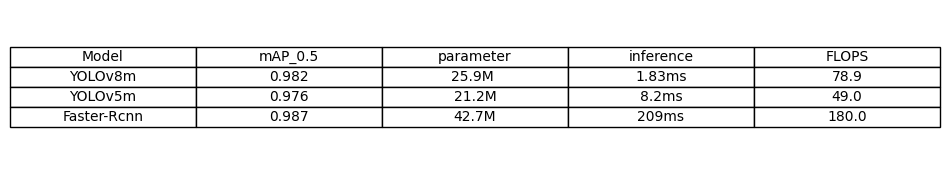

In [1]:
import pandas as pd
import matplotlib.pyplot as plt

# 데이터프레임 생성
columns = ['Model', 'mAP_0.5', 'parameter', 'inference', 'FLOPS']
comparison_df = pd.DataFrame(columns=columns)

# 데이터를 추가할 함수
def add_model_info(model_name, map_value, parameter_value, inference_value, flop_value):
    global comparison_df
    new_data = {
        'Model': model_name,
        'mAP_0.5': map_value,
        'parameter': parameter_value,
        'inference': inference_value,
        'FLOPS': flop_value
    }
    # 데이터프레임 확장
    comparison_df = pd.concat([comparison_df, pd.DataFrame([new_data])], ignore_index=True)

# 예시 데이터 추가
add_model_info('YOLOv8m', '0.982', '25.9M ' ,'1.83ms', '78.9')
add_model_info('YOLOv5m', '0.976','21.2M', '8.2ms', '49.0')
add_model_info('Faster-Rcnn', '0.987','42.7M', '209ms', '180.0')

# DataFrame을 목록의 목록으로 변환
table_data = [comparison_df.columns.tolist()] + comparison_df.values.tolist()

# DataFrame을 이미지로 저장
fig, ax = plt.subplots(figsize=(10, 2))  # 그림 크기 조정
ax.axis('tight')
ax.axis('off')
tbl = ax.table(cellText=table_data, loc='center', cellLoc='center', colWidths=[0.2]*len(comparison_df.columns))

# 표 크기 및 글꼴 크기 조정
tbl.auto_set_font_size(False)
tbl.set_fontsize(10)
tbl.scale(1.2, 1.2)

# 이미지 파일로 저장
plt.savefig('ob_compare.png', bbox_inches='tight', pad_inches=0.1)
plt.show()


In [ ]:
pwd

'/content'